### Preliminary plots of logistic regression fits of responses against individual predictors for selected sample grids

#### Data used
- Predictands: gridded precipitation data (AGCD v1), gridded evapotranspiration and runoff data (AWRA)
- Predictors: season, climate drivers (ENSO, IOD, and SAM, these could be categorical or quantitative)

#### Code creates plots of data at various time scales and thersholds

In [1]:
%who

Interactive namespace is empty.


In [2]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])?  y


/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarni

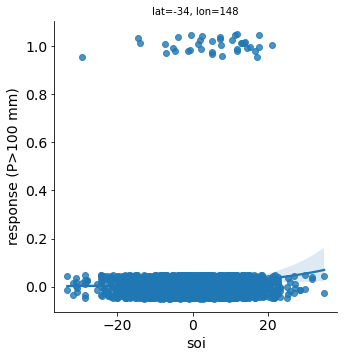

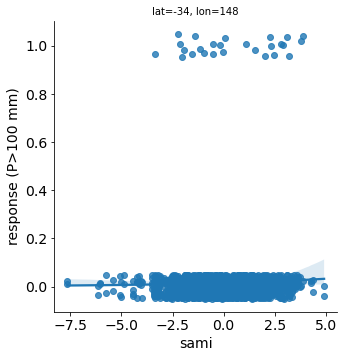

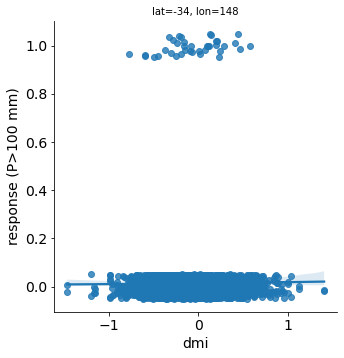

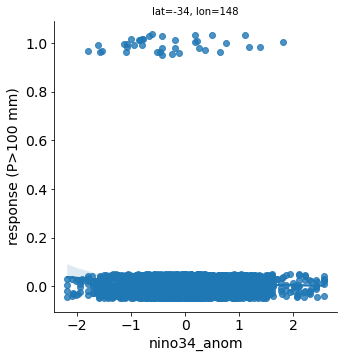

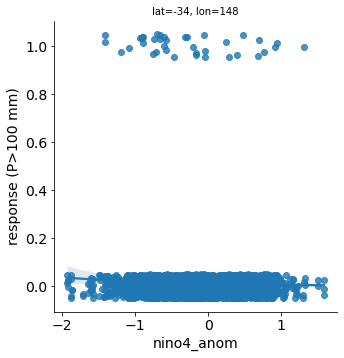

...

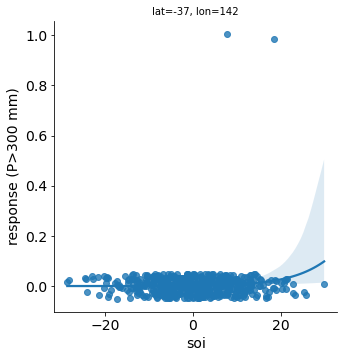

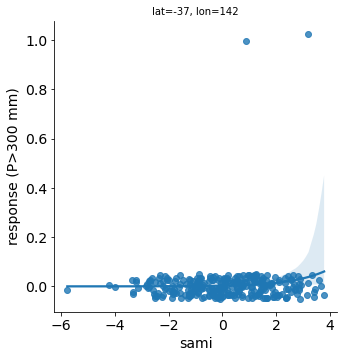

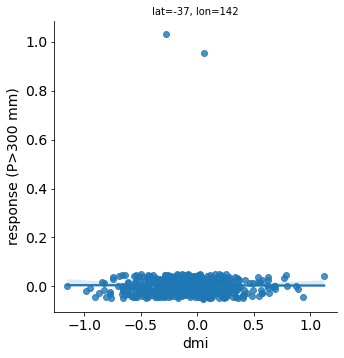

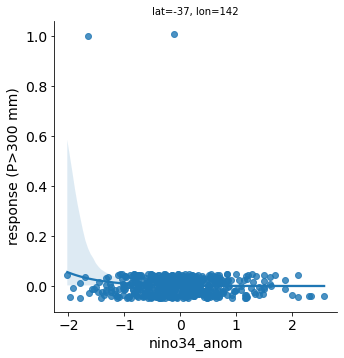

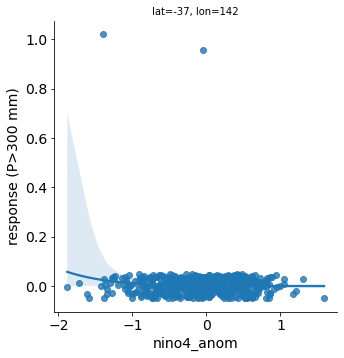

In [1]:
# Testing logistic fits for responses at multiple grids and timescales

import xarray as xr
import numpy as np
import pandas as pd
from statsmodels.formula.api import glm
import statsmodels.api as sm
#model = glm(formula, data, family)

out_dir = '/g/data/w97/ad9701/p_prob_analysis/temp_files/'

varname = 'P' #'PminusE' 'P'   # the name of the directory and file
vname = 'precip' #''PminusE' precip'  # the name of the variable inside the files
fname = varname + '_*_SEA_*.nc'

# select some thresholds to look at
threshList = [100, 150, 300]

# select some lat-lons to look at
latList = [-34, -34, -34, -37, -37, -37]
lonList = [148, 145, 142, 148, 145, 142]

# select some timescales for analysis
ts = [2, 6, 8, 12]

# get the sst predictors
sst_dir = '/g/data/w97/ad9701/p_prob_analysis/sst_data/'

pNames = ['soi', 'sami', 'dmi', 'nino34_anom', 'nino4_anom']
pFiles = ['soi_monthly.nc', 'newsam.1957.2021.nc', 'dmi.had.long.data.nc', 'nino34.long.anom.data.nc', 'nino4.long.anom.data.nc']

for p in np.arange(len(pNames)):
    ds_temp = xr.open_dataset(sst_dir+pFiles[p])
    if (p>0):
        ds_p[pNames[p]]=ds_temp[pNames[p]]
    else:
        ds_p = ds_temp
    del ds_temp

import seaborn as sns
import matplotlib.pyplot as plt

SMALLEST = 10
SMALL_SIZE = 14
MEDIUM_SIZE = 18
BIGGER_SIZE = 18

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALLEST)     # fontsize of the axes title
plt.rc('axes', labelsize=SMALL_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

for iW in ts:
    data_dir = '/g/data/w97/ad9701/p_prob_analysis/temp_files/'+varname+'_week'+str(iW)+'/'   # note: should we use the calibrated files here
    ds = xr.open_mfdataset(data_dir + fname, chunks = {'lat':400, 'lon':400}) #, combine='nested', concat_dim='time', chunks={'lat':1,'lon':1})
    da_var = ds[vname].chunk(chunks = {'lat':40,'lon':40,'time':-1})
    
    for iPt in np.arange(len(latList)):
        latSel = latList[iPt]
        lonSel = lonList[iPt]
        
        da_pt = da_var.sel(lat = latSel, lon = lonSel)
        da_pt.load()

        # select predictors for the same period as the data
        da_time_bymon = np.array(pd.to_datetime(da_pt.time).to_period('M').to_timestamp().floor('D'))
        ds_p_sel = ds_p.sel(time = da_time_bymon)

        for threshSel in threshList:
            # create a dataframe of reponse and predictors
            y = np.where(da_pt.values>=threshSel, 1, 0)
            x1 = da_pt['time.season'].values    #season

            xp = []
            for p in pNames:
                xp.append(ds_p_sel[p].values)
            xp_dict = dict(zip(pNames, xp))

            d = {"response": y, "season": x1}
            d.update(xp_dict)
            df = pd.DataFrame(d)

            # How does the response relate to the predictors?
            for p in pNames:
                figname = 'figures/logiReg_wSST/' + varname + '/week' + str(iW) + 'lat' + str(latSel) + '_lon' + str(lonSel) + '_thresh' + str(threshSel) + '_logReg_' + p + '.png'
                ax = sns.lmplot(x=p, y="response", data=df, logistic=True, y_jitter=.05)
                ax.set(ylabel='response (' + varname + '>' + str(threshSel) + ' mm)', title='lat=' + str(latSel) + ', lon=' + str(lonSel))
                plt.savefig(figname)

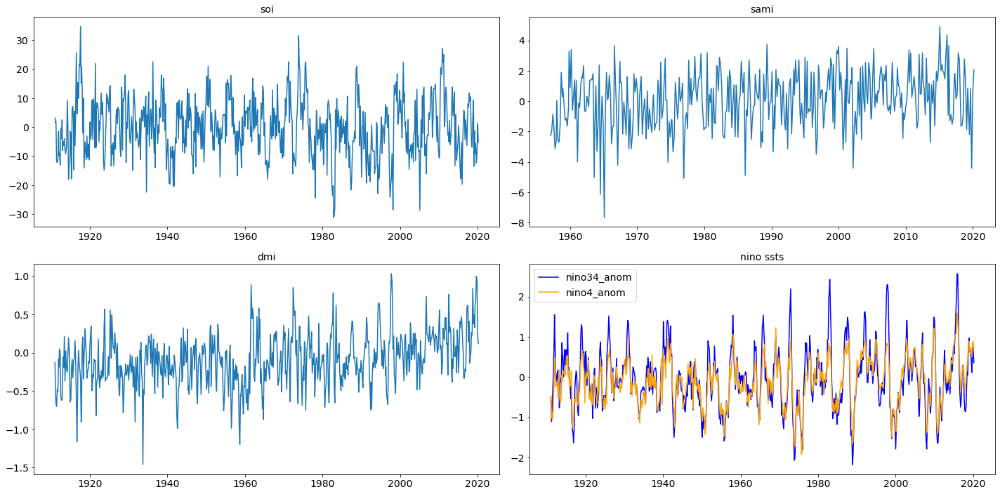

In [84]:
import matplotlib.pyplot as plt
%matplotlib inline

sstReg = 'dmi'
titleReg = 'DMI'

outdir = 'figures/SST_predictors/'
figname = 'sst_indices_downloaded.png'

SMALL_SIZE = 14
MEDIUM_SIZE = 18
BIGGER_SIZE = 18

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

labels = ['HadISST', 'ERSST']
colSel = ['dodgerblue', 'coral']

fig, axs = plt.subplots(2,2, figsize=(20,10))  # rows x cols, width x height
axs = axs.flatten()
      
for i in np.arange(len(pNames)-2):    
    axs[i].plot(ds_p_sel['time'], ds_p_sel[pNames[i]])
    axs[i].set(title = pNames[i])

axs[i+1].plot(ds_p_sel['time'], ds_p_sel[pNames[i+1]], color = "blue", label=pNames[i+1])
axs[i+1].plot(ds_p_sel['time'], ds_p_sel[pNames[i+2]], color = "orange", label=pNames[i+2])                                       
axs[i+1].set(title = "nino ssts")
legend = axs[i+1].legend(loc='upper left')

plt.tight_layout()
plt.savefig(outdir+figname)